In [1]:
# Primeiramente, importamos a biblioteca PIL, que é a mais usada para lidar com manipulação de arquivos de imagem.
# Da biblioteca PIL, importando o pacote 'Image':

import PIL
from PIL import Image

In [6]:
# Tentando abrir uma imagem:

arquivo = ('px-girl-front.jpg')
imagem = Image.open(arquivo)
print(imagem)

<PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=848x1280 at 0x7FDD2D769FD0>


In [39]:
# Ao rodar a célula, vemos que a imagem não foi mostrada no notebook, mas sim seu tipo e formato. 
# Para que a imagem apareça, fazemos:

imagem.show()

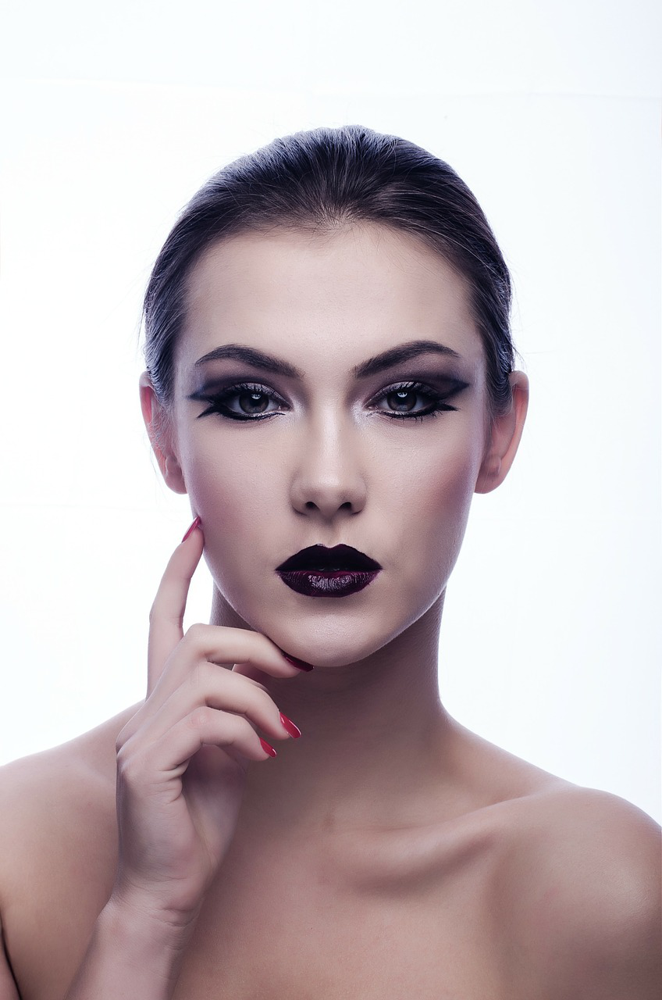

In [111]:
# Ao rodar a célula anterior, a imagem é aberta numa nova janela.
# Para que a imagem seja aberta no notebook, importamos o pacote display:

from IPython.display import display
display(imagem) # "Printa" a imagem

## copy( ):

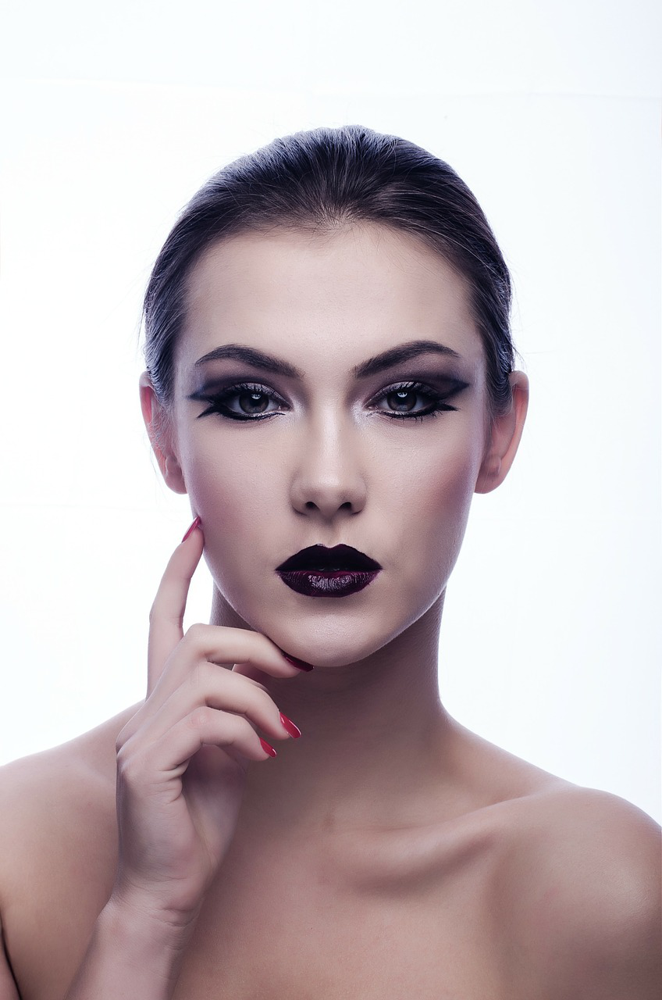

In [9]:
# A função 'copy()' pode ser usada quando desejamos manipular uma imagem mas manter sua versão original.

imagem.copy()

## save( ):

In [11]:
# Com a função 'save()' podemos salvar um determinado arquivo sob um novo nome e também mudar seu tipo (extensão):

imagem.save('px-girl-front1.png')
imagem=Image.open('px-girl-front1.png')
# Além de criar um novo arquivo com nome e formato diferente, podemos pedir para que a imagem seja inspecionada e suas especificações sejam informadas:

import inspect
inspect.getmro(type(imagem))

(PIL.PngImagePlugin.PngImageFile,
 PIL.ImageFile.ImageFile,
 PIL.Image.Image,
 object)

## filter( ):

In [14]:
# A biblioteca PILLOW também possui um pacote de filtros para serem usados nas imagens.
# Importando o pacote:

from PIL import ImageFilter
#help(ImageFilter) - A função 'help()' nos mostrará as formas como podemos usar esse pacote.

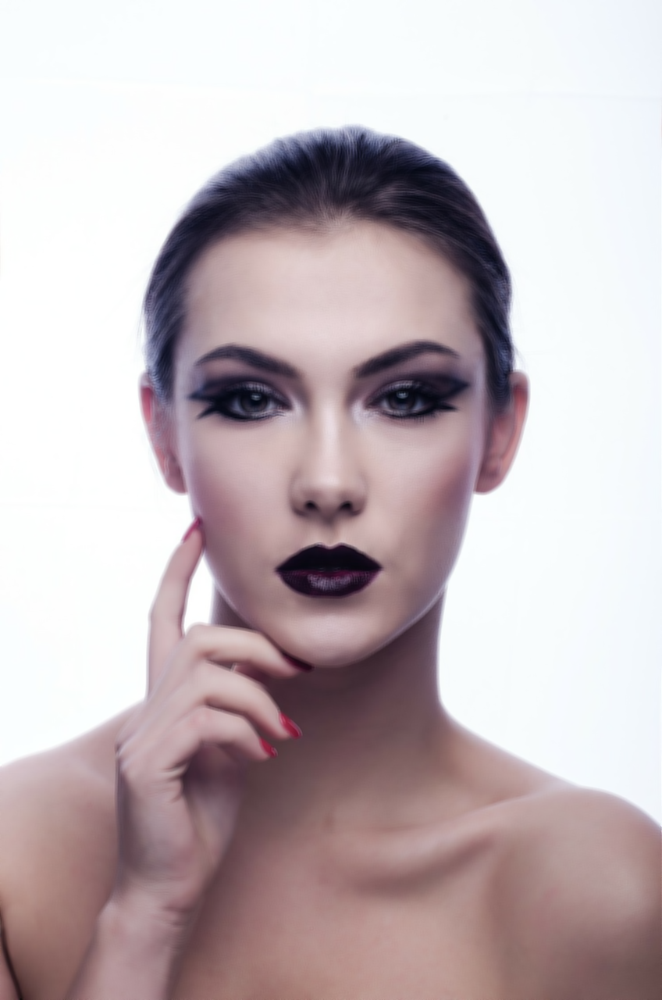

In [16]:
# Para utilizarmos alguns dos filtros disponíveis precisamos, primeiramente, converter as cores da imagem para RGB.
# Para isso, usamos a função 'convert()':

imagem_rgb = imagem.convert('RGB') # Modo de cores: vermelho, verde e azul.

# Aplicando o filtro 'BLUR' à imagem:

imagem_blurred = imagem_rgb.filter(PIL.ImageFilter.BLUR) 
display(imagem_blurred)

## crop( ):

In [24]:
# Também podemos cortar uma imagem, deixando apenas a região de interesse do usuário.
# Para isso faremos uso dos Pixels que compõem a imagem. Descobrindo a quantidade de pixels:

print("{}X{}" .format(imagem_blurred.width, imagem_blurred.height)) 

848X1280


In [25]:
# Esse resultado nos diz que a imagem "possui" 848 pixels no eixo X (width) e 1280 no eixo Y (height).

In [26]:
help(imagem_blurred.crop)

# A função "crop()" nos retorna uma região retangular da imagem (escolhida pelo usuário).

Help on method crop in module PIL.Image:

crop(box=None) method of PIL.Image.Image instance
    Returns a rectangular region from this image. The box is a
    4-tuple defining the left, upper, right, and lower pixel
    coordinate. See :ref:`coordinate-system`.
    
    Note: Prior to Pillow 3.4.0, this was a lazy operation.
    
    :param box: The crop rectangle, as a (left, upper, right, lower)-tuple.
    :rtype: :py:class:`~PIL.Image.Image`
    :returns: An :py:class:`~PIL.Image.Image` object.



<PIL.PngImagePlugin.PngImageFile image mode=RGB size=848x1280 at 0x7FDD2D773850>


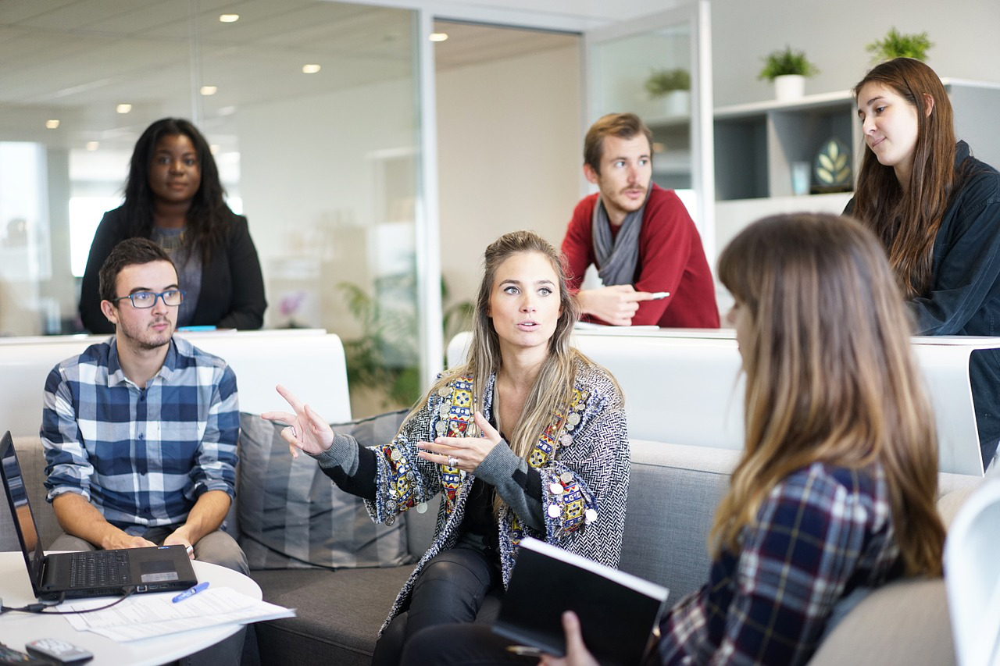

In [40]:
# Fazendo o upload de outra imagem:

arquivo2 = ('px-people.jpg')
imagem2 = Image.open(arquivo2)
print(imagem)

display(imagem2)


In [41]:
print("{}X{}" .format(imagem2.width, imagem2.height))

1280X853


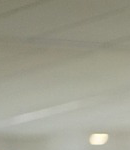

In [48]:
# Para definir essa região retangular utilizando a função "crop()", fornecemos ao Python as informação relacionadas ao canto super esquerdo da 
# região desejada, e o canto inferior direito, começando a "contar" a partir do canto superior esquerdo (0,0).
# A ordem a ser passada como parâmetro é: (esquerda, superior, direta, inferior).
# Usando como exemplo a mão da modelo na foto, podemos pedir o seguinte: 

display(imagem2.crop((60,0,190,150)))

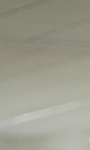

In [49]:
display(imagem2.crop((60,0,150,150))) # Pode-se observar que, terceira posição do parâmetro é o "comprimento" no eixo X.

## ImageDraw:

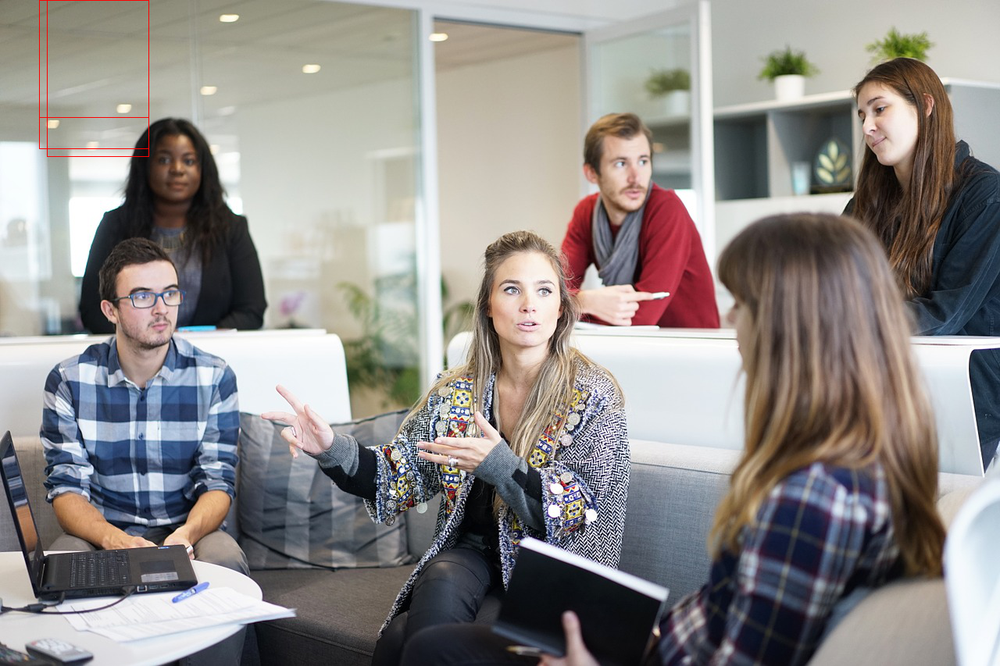

In [67]:
# O pacote 'ImageDraw' serve para que, como o próprio nome já diz, possamos "desenhhar" sobre a imagem:

from PIL import ImageDraw
drawing_object = ImageDraw.Draw(imagem2)
drawing_object.rectangle((60,0,190,200), fill = None, outline = 'red')
display(imagem2)

##  Funções Adicionais da PILLOW

Agora, vamos começar a trabalhar com múltiplas imagens.

In [99]:
# Algo muito comum de se fazer ao trabalhar com diversas imagens, é criar um "lençol" de imagens. Ou seja, diversas imagens "grudadas" umas nas outras.
# Vamos tentar criar um lençol da nossa 'imagem'. Mas, antes, vamos diminuir seu tamanho e mudar sua luminosidade algumas vezes.
# Importando o módulo necessário:

from PIL import ImageEnhance 

# Para ajustar a luminosidade, essa função utiliza parâmetros entre 0.0 (imagem completamente preta) e 1.0 (luminosidade original da imagem).
# Todas as classes do módulo 'ImageEnhance' trabalham da mesma forma: cria-se um objeto (nesse caso 'Brightness'), chama-se a função 'enhance()'
# com o parâmetro apropriado.

# Vamos gerar um pequeno loop para que 10 imagens, com diferentes luminosidades, sejam geradas. 
# Primeiro, precisamos do objeto 'luminosidade' com a imagem:

enhancer = ImageEnhance.Brightness(imagem2)
imagens = [] # Lista criada para armazenar as imagens geradas.

for i in range(0, 10):
    imagens.append(enhancer.enhance(i/10)) # Dividimos i por 10 para obtermos os decimais desejar, e adicionamos os resultados à lista "imagens"

print(imagens) # Através desse print obtemos uma lista com as imagens geradas e suas especificações.


[<PIL.Image.Image image mode=RGB size=1280x853 at 0x7FDD05500550>, <PIL.Image.Image image mode=RGB size=1280x853 at 0x7FDD057FE890>, <PIL.Image.Image image mode=RGB size=1280x853 at 0x7FDD054FA890>, <PIL.Image.Image image mode=RGB size=1280x853 at 0x7FDD05BA94D0>, <PIL.Image.Image image mode=RGB size=1280x853 at 0x7FDD05BA98D0>, <PIL.Image.Image image mode=RGB size=1280x853 at 0x7FDD05A13390>, <PIL.Image.Image image mode=RGB size=1280x853 at 0x7FDD05A204D0>, <PIL.Image.Image image mode=RGB size=1280x853 at 0x7FDD05A20450>, <PIL.Image.Image image mode=RGB size=1280x853 at 0x7FDD05A20A50>, <PIL.Image.Image image mode=RGB size=1280x853 at 0x7FDD05A13410>]


In [100]:
# Após gerar essas imagens, vamos compor nosso "lençol". Isso pode ser feito de diversas formas mas, aqui, vamos chegar ao resultado desejado
# criando uma nova imagem composta por diversas imagens originais usando a ferramenta "PIL.Image.new"

help(PIL.Image.new)

Help on function new in module PIL.Image:

new(mode, size, color=0)
    Creates a new image with the given mode and size.
    
    :param mode: The mode to use for the new image. See:
       :ref:`concept-modes`.
    :param size: A 2-tuple, containing (width, height) in pixels.
    :param color: What color to use for the image.  Default is black.
       If given, this should be a single integer or floating point value
       for single-band modes, and a tuple for multi-band modes (one value
       per band).  When creating RGB images, you can also use color
       strings as supported by the ImageColor module.  If the color is
       None, the image is not initialised.
    :returns: An :py:class:`~PIL.Image.Image` object.



In [101]:
# Essa a função exige que passemos um modo como parâmentro. Nesse caso vamos usar 'RGB', que é o modo original da imagem, mas existem diversos outros.
# Para o tamanho, passamos os parâmetros da largura (width) e altura (height). Vamos usar a largura original da imagem e colocar a altura*10.
# A cor é opcional e deixaremos como está:

primeira_imagem = imagens[0] # criamos uma variável contendo a primeira imagem da lista criada anteriormente.
sheet = PIL.Image.new(primeira_imagem.mode, (primeira_imagem.width, 10*primeira_imagem.height))

In [102]:
# Agora, criamos um loop que passa pela nossa lista e "cola" as imagens geradas através do comando 'paste()'.
# A função 'paste()' precisa ser chamada junto com nosso objeto 'sheet'.
# A localização no eixo X será sempre em 0. Vamos criar um contador para a localização em Y, começando em 0:

loc_y = 0
for img in imagens:
    sheet.paste(img, (0, loc_y)) # Nessa linha estamos 'colando' em nosso objeto 'sheet' a imagem gerada, sempre em x=0 e Y=loc_y
    loc_y=loc_y+1280 # Aqui estamos adicionando 12801 pixels na localização em y, que o height da nossa figura. Esse é o nosso "passo".

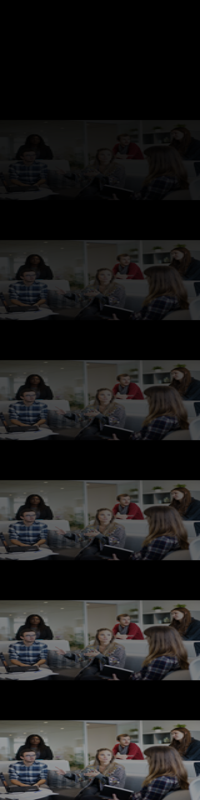

In [105]:
# Por último, vamos redimensionar nossa imagem usando a função 'resize()':

sheet = sheet.resize((200,800))
display(sheet)

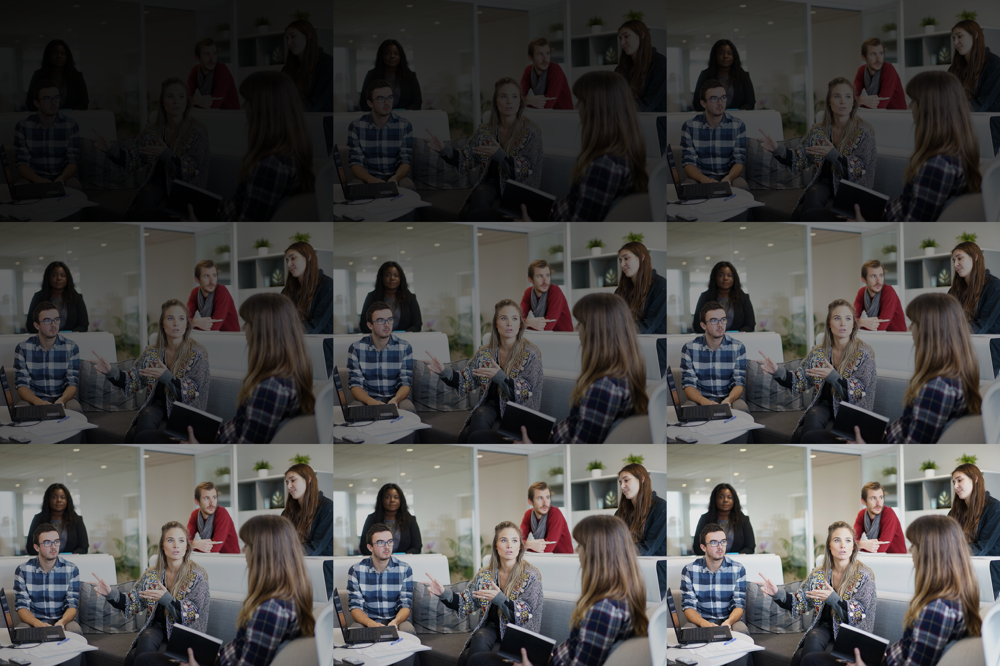

In [109]:
# Agora que temos uma coluna, podemos tentar criar nosso 'lençol'. Para isso, vamos fazer nosso canvas com 3X sua largura e 3X sua altura.

sheet = PIL.Image.new(primeira_imagem.mode, (primeira_imagem.width*3, primeira_imagem.height*3)) # criando nosso lençol 3X3

# Dessa vez, X e Y vão variar, então definimos suas posições iniciais:

x=0
y=0

# Criamos o loop a partir da imagem na posição 1, para que tenhamos 9 no total:

for img in imagens[1:]:
    sheet.paste(img, (x,y))
    # Agora, atualizamos nossas posições X e Y:
    if x+primeira_imagem.width == sheet.width:
        x = 0
        y=y+primeira_imagem.height
    else:
        x=x+primeira_imagem.width
        
# Redimensionando nosso lençol:

sheet = sheet.resize((int(sheet.width), int(sheet.height))) # Transformamos de float para int pois a função só aceita números inteiros.
display(sheet)